In [14]:
%matplotlib inline
import sys
sys.path.append('../src')
from params import params as P
import numpy as np
import patch_sampling
from parallel import ParallelBatchIterator
np.random.seed(0)
P.DATA_LEVEL=0

In [15]:
train_generator, validation_generator = patch_sampling.prepare_sampler()

Loading validation masks
getting all masks
Done in  19.6260709763
... is done
Loading train masks
getting all masks
Done in  33.307970047
... is done


In [18]:
X_train = [20]*10
train_gen = ParallelBatchIterator(train_generator, X_train, ordered=False,
                                                batch_size=1,
                                                multiprocess=False,
                                                n_producers=2)

X_val = [20]*10
val_gen = ParallelBatchIterator(validation_generator, X_val, ordered=False,
                                                batch_size=1,
                                                multiprocess=False,
                                                n_producers=2)


0.656283


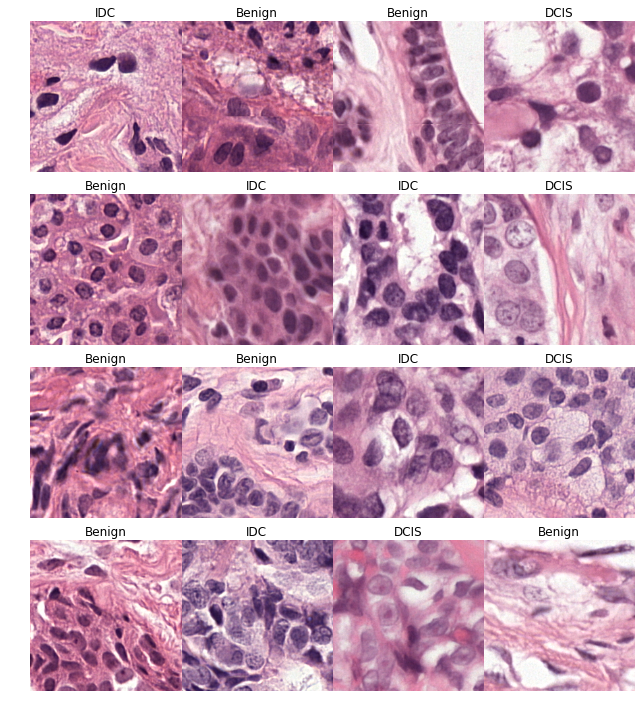

0.71203


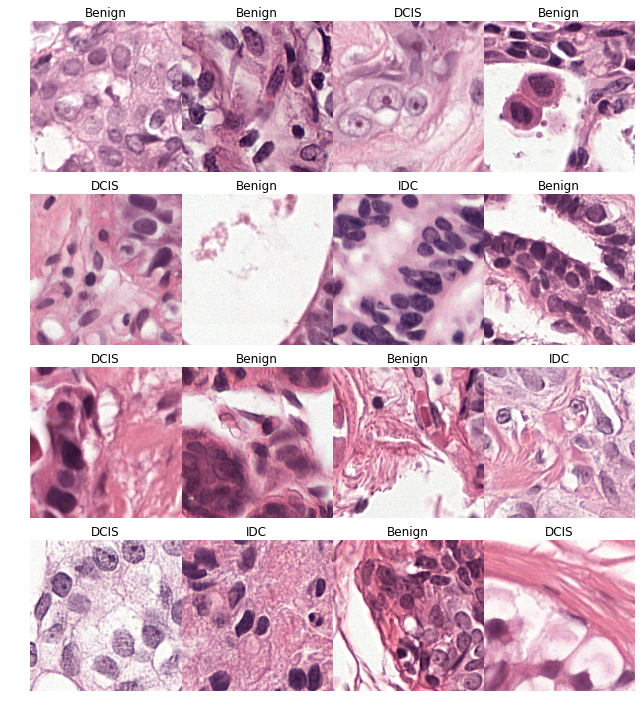

0.691855


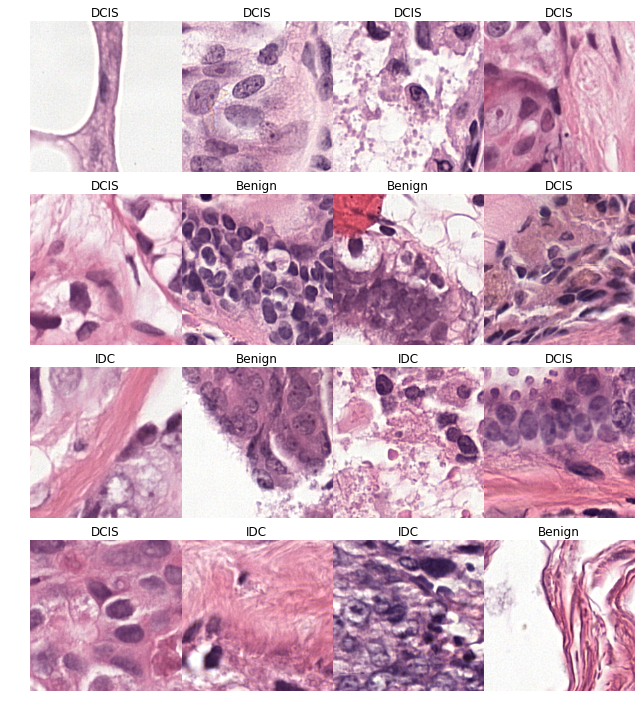

0.69726


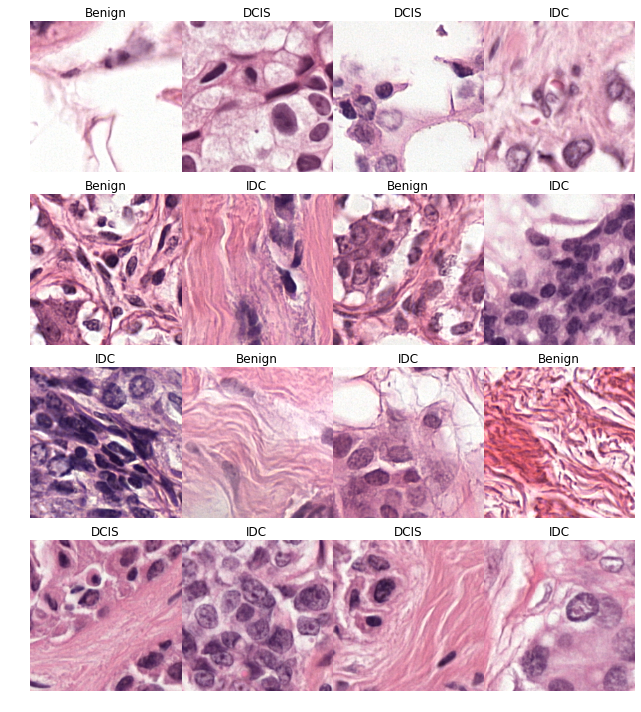

0.690839


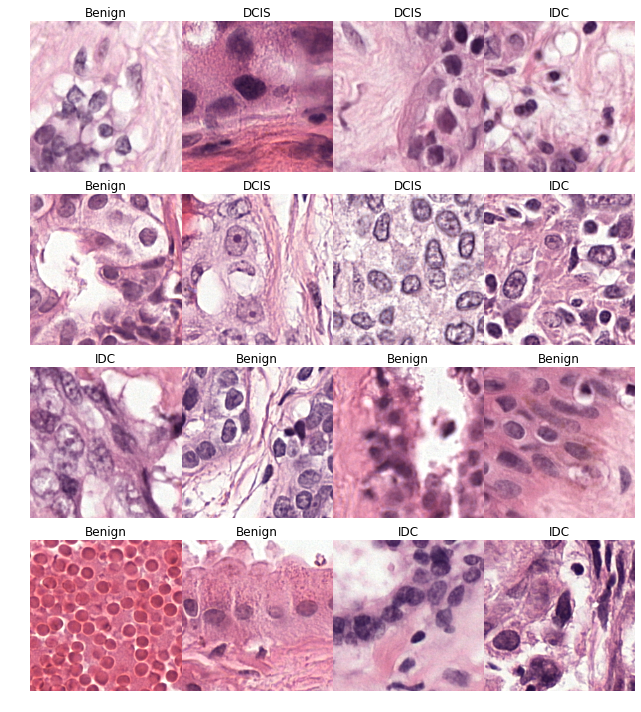

0.732746


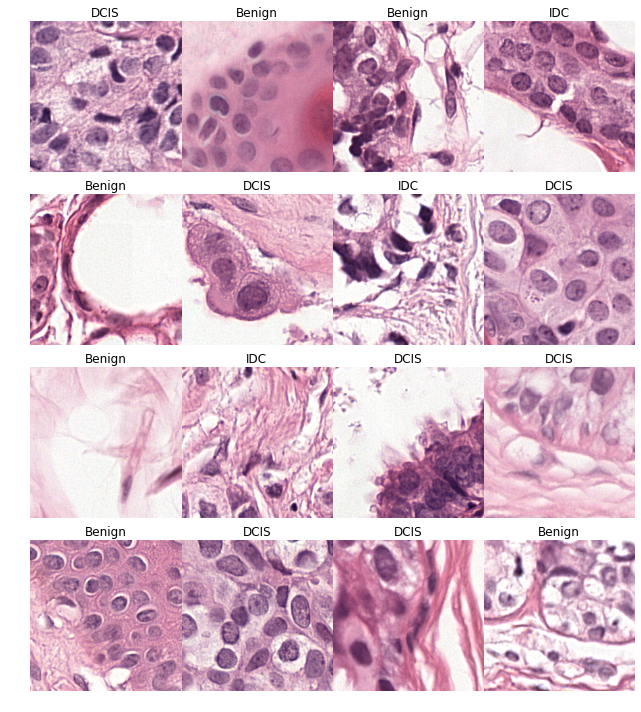

0.69691


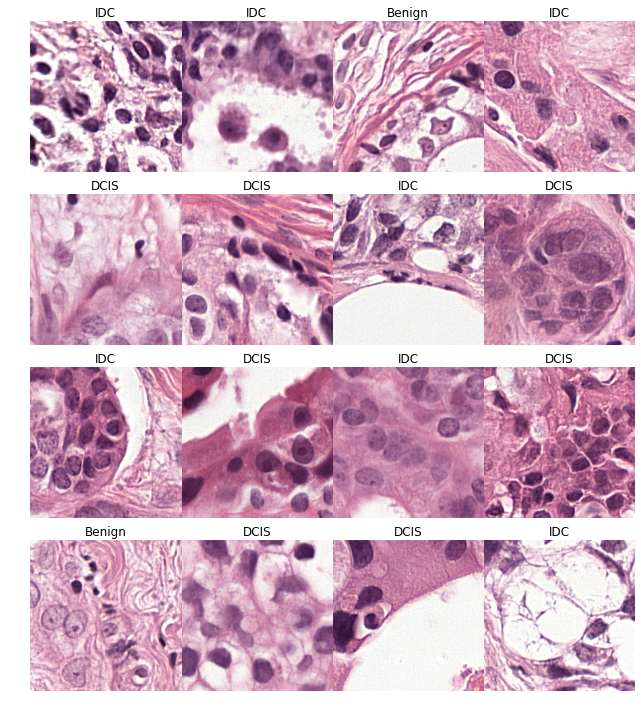

0.706719


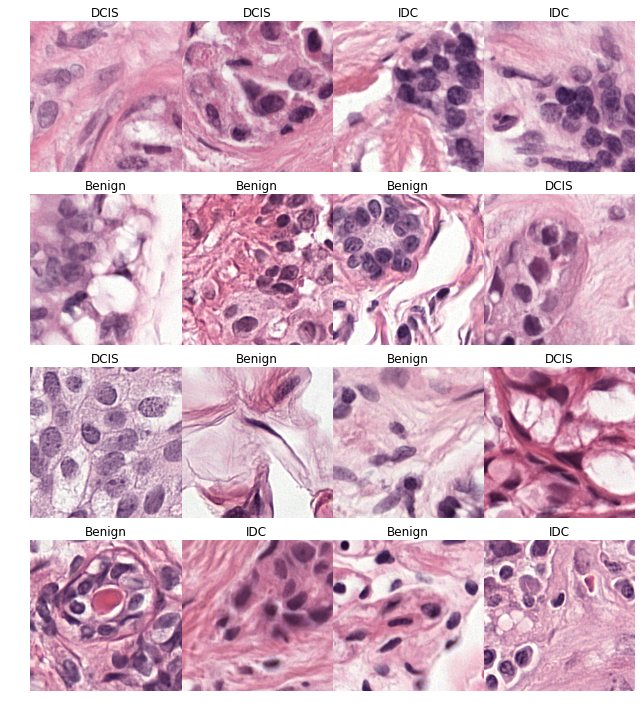

0.717931


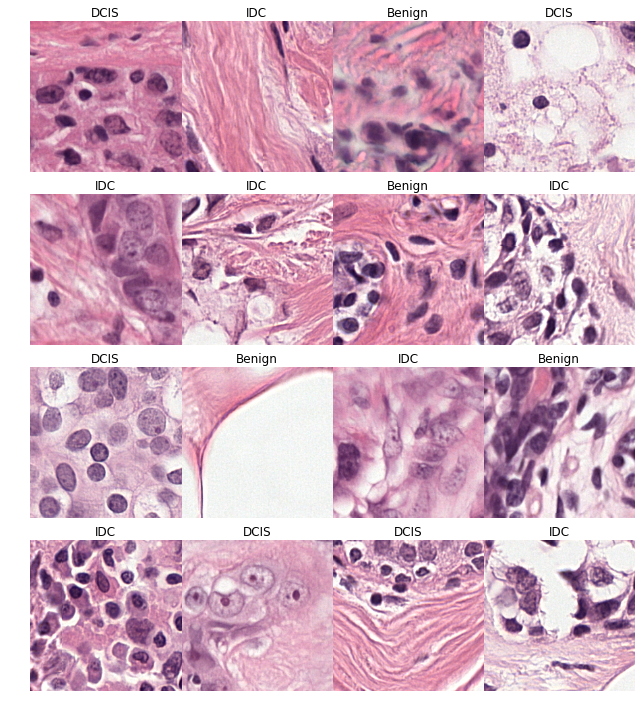

0.706773


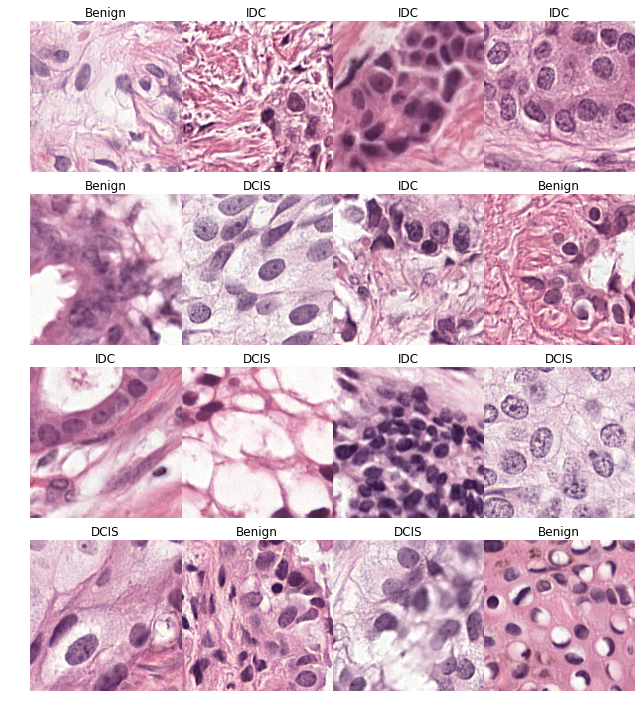

In [ ]:
import matplotlib.pyplot as plt
from dataset import label_name
np.random.seed(0)
for batch in train_gen:
    images, labels = batch
    
    
        
    im = images.transpose(0,2,3,1)

    im[:,:,:,0] += P.MEAN_PIXEL[0]
    im[:,:,:,1] += P.MEAN_PIXEL[1]
    im[:,:,:,2] += P.MEAN_PIXEL[2]


    
    f, axarr = plt.subplots(4,4,figsize=(12,12))
    

    for i in range(16):
        x = i%4
        y = i/4
        axarr[y,x].imshow(im[i])
        axarr[y,x].set_title(label_name(labels[i]))
        axarr[y,x].axis('off')

    print np.mean(im)
    
    plt.subplots_adjust(wspace = -0.3, hspace=0.15)
    plt.show()
    
    

In [ ]:
np.random.seed(0)
for batch in val_gen:
    images, labels = batch
    
    
        
    im = images.transpose(0,2,3,1)

    im[:,:,:,0] += P.MEAN_PIXEL[0]
    im[:,:,:,1] += P.MEAN_PIXEL[1]
    im[:,:,:,2] += P.MEAN_PIXEL[2]


    
    f, axarr = plt.subplots(4,4,figsize=(12,12))
    

    for i in range(16):
        x = i%4
        y = i/4
        axarr[y,x].imshow(im[i])
        axarr[y,x].set_title(label_name(labels[i]))
        axarr[y,x].axis('off')

    print np.mean(im)
        
    plt.subplots_adjust(wspace = -0.3, hspace=0.15)
    plt.show()
    